# AnimeGAN: A Novel Lightweight GAN for Photo Animation
---
Anime là một loại nghệ thuật phim ảnh xuất phát từ cuộc sống thường nhật. Nó được thể hiện theo nhiều khía cạnh khác nhau như quảng cáo, giáo dục, và tất nhiên là phim ảnh. Hiện tại, vẫn còn các hãng phim thực hiện các cảnh trong Anime một cách thủ công (bằng tay). Tuy nhiên công việc này đòi hỏi một sự tập trung cao độ và là người phải thực sự có tố chất. Đối với người làm phim Anime thủ công, tao ra một tác phẩm chất lượng cần phải tỉ mỉ trong từng nét vẻ, màu sắc và độ tương phản, đồng nghĩa với một công việc khó khăn và tiêu tốn rất nhiều thời gian. Vì vậy, một kỹ thuật tự động chuyển đổi hình ảnh thật thành hình ảnh Anime chất lương cao thực sự giá trị và cần thiết. Nó không chỉ giúp người làm phim có thể sáng tạo và đỡ tốn thời gian, mà còn có thể giúp những người bình thường có thể tự tạo ra một bộ phim Anime cho bản thân mình.



Hiện tại, các nhà nguyên cứu đã đề xuất một vài cấu trúc GAN về phương pháp chuyển đổi đặc tính hình ảnh(style transfer). Mặc dù những phương pháp này đạt được vài thành công trong anime style transfer nhưng vẫn có một số vấn đề như sau:

1.   Ảnh tạo ra không rõ ràng nội dung của đặc tính hình ảnh Anime
2.   Ảnh tạo ra mất nội dung ban đầu của bức ảnh.
3.   Mô hình mạng xử dụng lượng trọng số lớn làm tăng chi phí khi thực hiện(ram).

Để giải quyết các vấn đề trên thì tác giả đề xuất mô hình a lightweight GAN, còn được gọi là AnimeGan, nhằm mục đính chuyển đổi ảnh thật thành ảnh Anime với chất lượng cao. AnimeGan là một mô hình "lightweight generative adversarial" xử dụng lương nhỏ trọng số và áp dụng Gram matrix để lấy thêm nhiều đặc tính sống động của hình ảnh. Giải pháp đưa ra là một tập hình ảnh thật và một tập hình anime để training. Giải pháp đưa ra là sử dụng data không liên quan với nhau để training, đồng nghĩa với việc hình thật và anime không có liên quan về mặt nội dung và hình thức.




Để nâng cao khả năng tạo ra ảnh mới, thì tác giả đưa ra 3 loại loss functions mới. Grayscale style loss, the color recontruction loss và the grayscale adversarial loss.

Trong Generative Network, grayscale style loss và the color reconstruction loss làm cho hình ảnh sau khi tạo ra có được nhiều nét của phong cách anime và giữ được màu sắc của bức ảnh bang đầu. The grayscale adversarial loss trong discriminator network làm cho ảnh sau khi tạo ra có mà sắc sinh động hơn. Trong discriminator network thì tác giả cũng dùng edge-promoting adversarial loss (từ cartoonGAN) để giữ cho các đường nét được rõ ràng.

Thêm vào đó, để làm hình ảnh tạo ra từ G có được chiều sâu về nội dung như ảnh input thì tác giả sử dụng pre-trained VGG19 model với trách nhiệm giám sát với L1 loss.

# AnimeGAN

## AnimeGan bao gồm 2 CNN:

- Một là Generator G được sử dụng để chuyển đổi hình ảnh thật qua hình anime.
- Hai là Discriminator D được sử dụng để xác định đâu là ảnh anime giữa output của G và input ảnh anime.




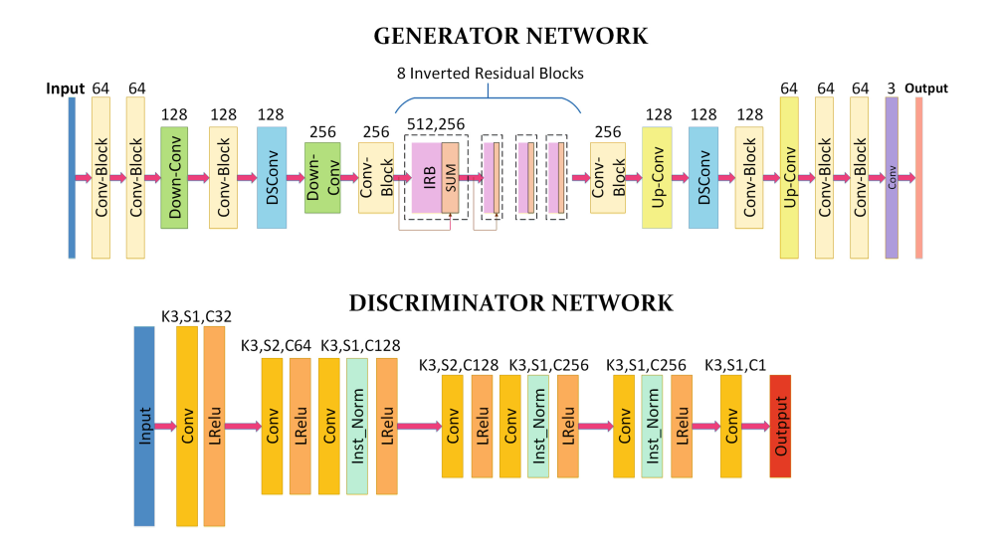


In [ ]:
!git clone https://github.com/TachibanaYoshino/AnimeGAN

Cloning into 'AnimeGAN'...
remote: Enumerating objects: 165, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (152/152), done.
remote: Total 876 (delta 59), reused 56 (delta 3), pack-reused 711
Receiving objects: 100% (876/876), 142.12 MiB | 22.81 MiB/s, done.
Resolving deltas: 100% (236/236), done.


In [ ]:
import os
os.chdir('AnimeGAN')
print(os.getcwd())

/content/AnimeGAN


In [ ]:
URL='https://github.com/TachibanaYoshino/AnimeGAN/releases/download/Haoyao-style_V1.0/Haoyao-style.zip'
ZIP_FILE='./checkpoint/Haoyao-style.zip'
TARGET_DIR='./checkpoint/saved_model'

!mkdir -p ./checkpoint
!wget -N $URL -O $ZIP_FILE
!mkdir -p $TARGET_DIR
!unzip $ZIP_FILE -d $TARGET_DIR
!rm $ZIP_FILE

DatesetURL='https://github.com/TachibanaYoshino/AnimeGAN/releases/download/dataset-1/dataset.zip'
ZIP_FILE='./dataset.zip'
TARGET_DIR='./dataset'

!rm -rf dataset
!wget -N $DatesetURL -O $ZIP_FILE
!unzip $ZIP_FILE -d $TARGET_DIR
!rm $ZIP_FILE

VGG_FILE='./vgg19_weight/vgg19.npy'
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1U5HCRpZWAbDVLipNoF8t0ZHpwCRX7kdF' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1U5HCRpZWAbDVLipNoF8t0ZHpwCRX7kdF" -O $VGG_FILE && rm -rf /tmp/cookies.txt


Streaming output truncated to the last 5000 lines.
  inflating: ./dataset/train_photo/2015-03-07 14_38_57.jpg  
  inflating: ./dataset/train_photo/2015-03-07 18_21_50.jpg  
  inflating: ./dataset/train_photo/2015-03-07 18_24_15.jpg  
  inflating: ./dataset/train_photo/2015-03-07 18_49_30.jpg  
  inflating: ./dataset/train_photo/2015-03-07 23_19_50.jpg  
  inflating: ./dataset/train_photo/2015-03-07 23_28_34.jpg  
  inflating: ./dataset/train_photo/2015-03-08 01_09_12.jpg  
  inflating: ./dataset/train_photo/2015-03-08 08_42_08.jpg  
  inflating: ./dataset/train_photo/2015-03-08 09_30_22.jpg  
  inflating: ./dataset/train_photo/2015-03-08 10_54_57.jpg  
  inflating: ./dataset/train_photo/2015-03-08 11_36_11.jpg  
  inflating: ./dataset/train_photo/2015-03-08 13_18_42.jpg  
  inflating: ./dataset/train_photo/2015-03-08 14_03_13.jpg  
  inflating: ./dataset/train_photo/2015-03-08 14_37_55.jpg  
  inflating: ./dataset/train_photo/2015-03-08 15_45_50.jpg  
  inflating: ./dataset/train_photo

In [ ]:
!nvidia-smi
# os.environ["CUDA_VISIBLE_DEVICES"] = "1" ->0


Mon Jul  6 05:42:37 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install tensorflow==1.15


     |████████████████████████████████| 412.3MB 40kB/s 
     |████████████████████████████████| 3.8MB 48.8MB/s 
     |████████████████████████████████| 512kB 47.7MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=648a3b3412f91bcfcb5fe849b328f1659c426f27a8197f65cfd866d77a1e56f7
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.10.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3
  Found existing installation: tensorboard 2.2.2
    Uninstalling tensorboard-2.2.2:
      Successfully uninstalled tensorboard-2.2.2
  Found existing installation: tensorflow-estimator 2.2.0
    Uninstalling tensorflow-estimator-2.2.0:
      Successfully uninstalled tensorflow-estimator-2.2.0
  Found existing installation: 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
!zip -r /content/drive/'My Drive'/weight/saved_model_3000/weight.zip /content/drive/'My Drive'/weight/saved_model_3000 

  adding: content/drive/My Drive/weight/saved_model_3000/ (stored 0%)
  adding: content/drive/My Drive/weight/saved_model_3000/AnimeGAN.model-24.data-00000-of-00001 (deflated 8%)
  adding: content/drive/My Drive/weight/saved_model_3000/AnimeGAN.model-24.index (deflated 68%)
  adding: content/drive/My Drive/weight/saved_model_3000/AnimeGAN.model-24.meta (deflated 8%)
  adding: content/drive/My Drive/weight/saved_model_3000/checkpoint (deflated 90%)


In [ ]:
!zip -r /content/drive/'My Drive'/train_photo.zip /content/AnimeGAN/dataset/train_photo

In [ ]:
%cd /content/AnimeGAN/checkpoint/saved_model_3000
!unzip /content/drive/'My Drive'/weight/saved_model_3000/weight.zip

/content/AnimeGAN/checkpoint/saved_model_3000
Archive:  /content/drive/My Drive/weight/saved_model_3000/weight.zip
   creating: content/drive/My Drive/weight/saved_model_3000/
  inflating: content/drive/My Drive/weight/saved_model_3000/AnimeGAN.model-24.data-00000-of-00001  
  inflating: content/drive/My Drive/weight/saved_model_3000/AnimeGAN.model-24.index  
  inflating: content/drive/My Drive/weight/saved_model_3000/AnimeGAN.model-24.meta  
  inflating: content/drive/My Drive/weight/saved_model_3000/checkpoint  


In [ ]:
%cd /content/AnimeGAN/dataset/train_photo

!unzip /content/drive/'My Drive'/train_photo_original.zip

In [ ]:
import glob
images = glob.glob('/content/AnimeGAN/dataset/train_photo' + '/*.jpg')
print(len(images))





3000


In [ ]:
%cd /content/AnimeGAN/checkpoint

!unzip /content/drive/'My Drive'/weight.zip


In [ ]:
!rm /content/AnimeGAN/checkpoint/AnimeGAN_Hayao_lsgan_300_300_1_3_10 -r
!ln -s /content/drive/'My Drive'/weight/AnimeGAN_Hayao_lsgan_300_300_1_3_10 /content/AnimeGAN/checkpoint

In [ ]:
%cd /content/AnimeGAN
!python main.py  --phase train --dataset Hayao --epoch 60 --init_epoch 1 

/content/AnimeGAN



2020-07-09 17:47:41.711225: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 AVX512F FMA
2020-07-09 17:47:41.716030: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2000165000 Hz
2020-07-09 17:47:41.716357: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x27e92c0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-07-09 17:47:41.716387: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2020-07-09 17:47:41.718130: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-07-09 17:47:41.830718: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020

In [ ]:
%cd /content/AnimeGAN
!python test.py --checkpoint_dir checkpoint/saved_model --test_dir dataset/test/real --style_name 0e
!python test.py --checkpoint_dir checkpoint/saved_model_3000 --test_dir dataset/test/real --style_name 25e


/content/AnimeGAN
checkpoint/saved_model


The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Please use `layer.__call__` method instead.






2020-07-10 07:37:00.557395: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 AVX512F FMA
2020-07-10 07:37:00.562218: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2000175000 Hz
2020-07-10 07:37:00.562401: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x1eeb2c0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-07-10 07:37:00.562429: I t

Real image:


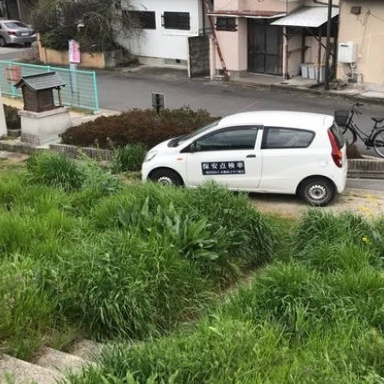

Fake image:


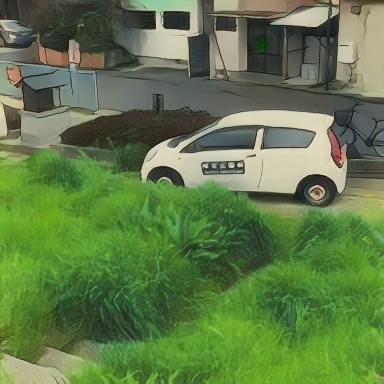

Fake image 25e:


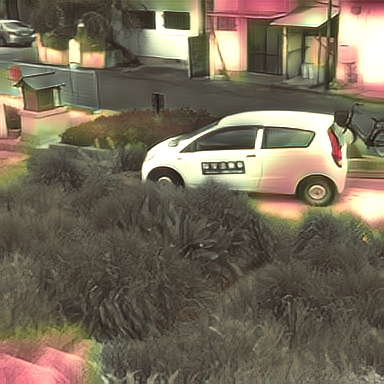

Real image:


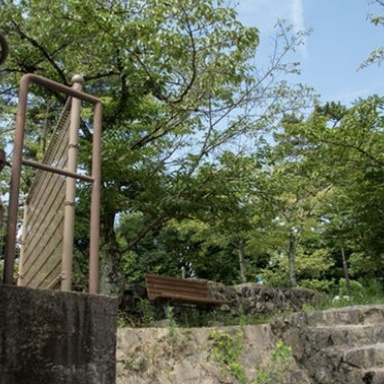

Fake image:


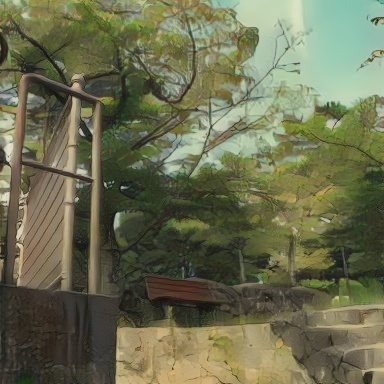

Fake image 25e:


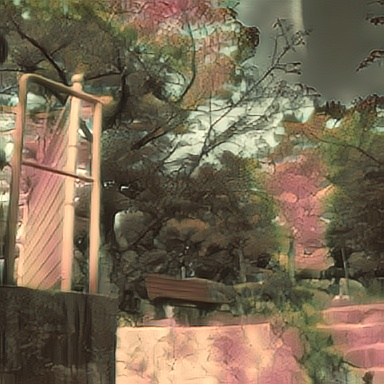

Real image:


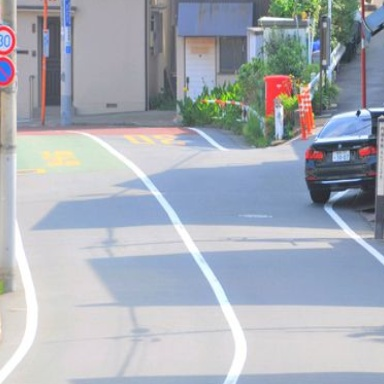

Fake image:


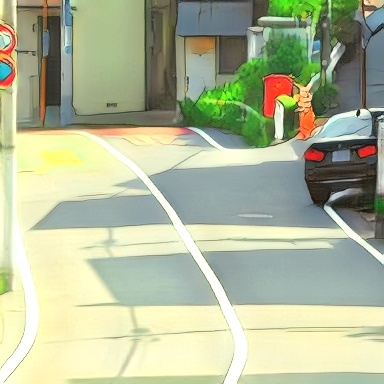

Fake image 25e:


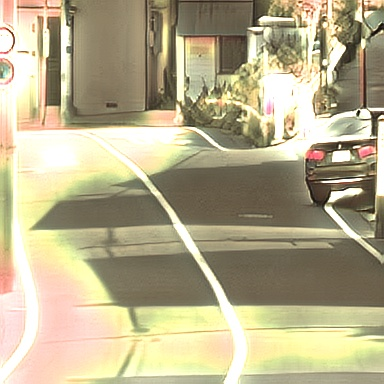

Real image:


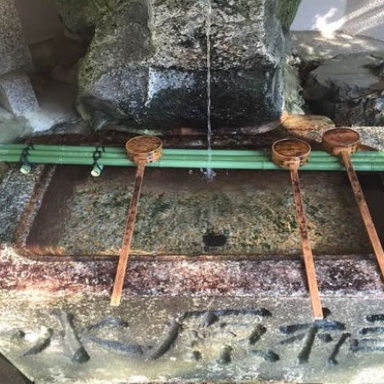

Fake image:


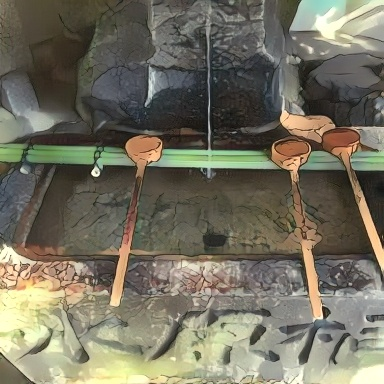

Fake image 25e:


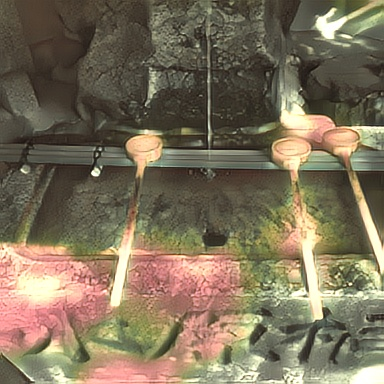

Real image:


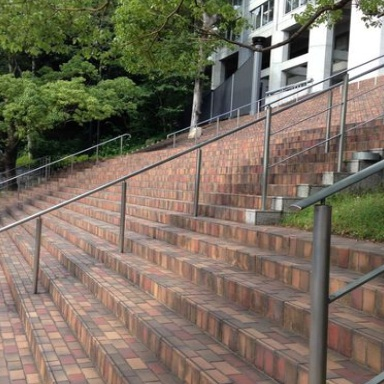

Fake image:


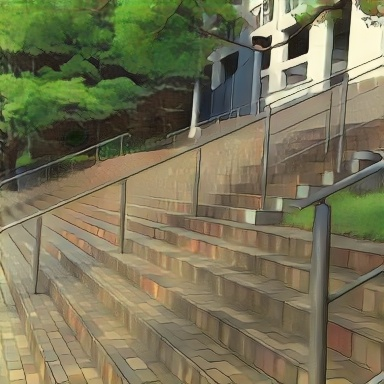

Fake image 25e:


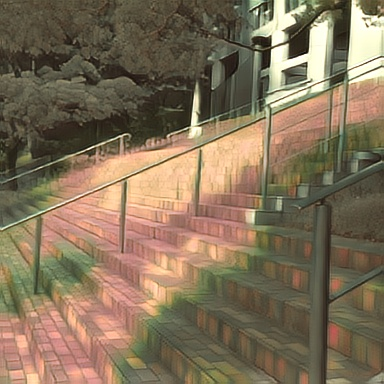

Real image:


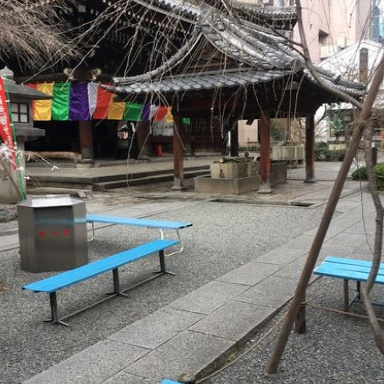

Fake image:


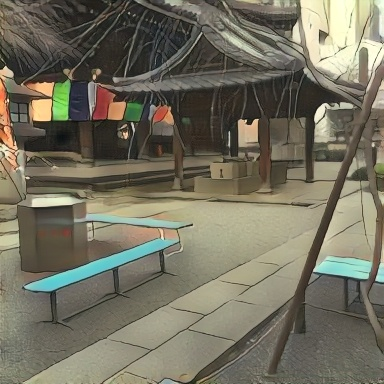

Fake image 25e:


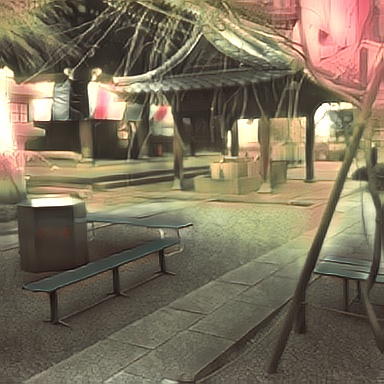

Real image:


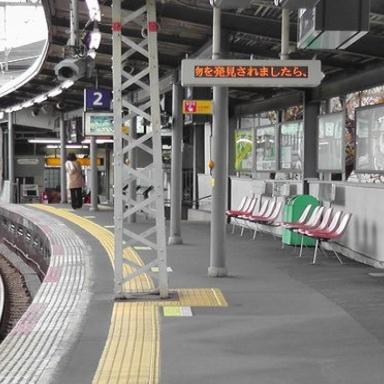

Fake image:


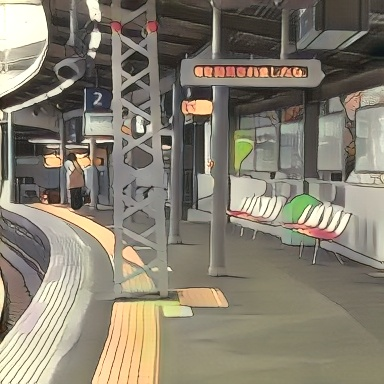

Fake image 25e:


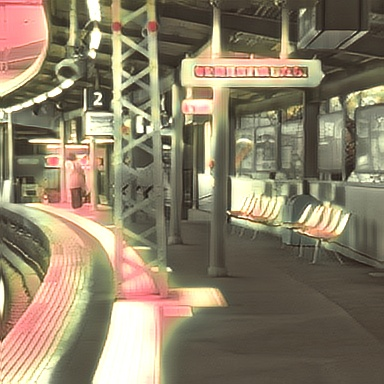

Real image:


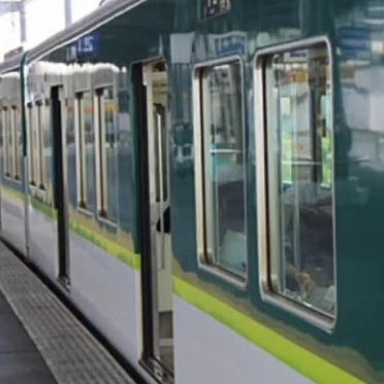

Fake image:


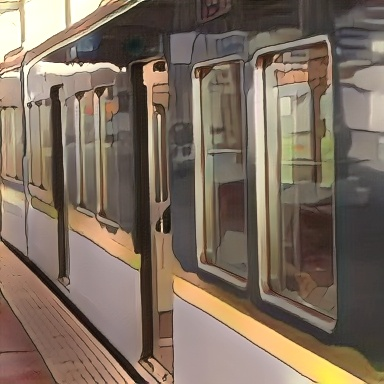

Fake image 25e:


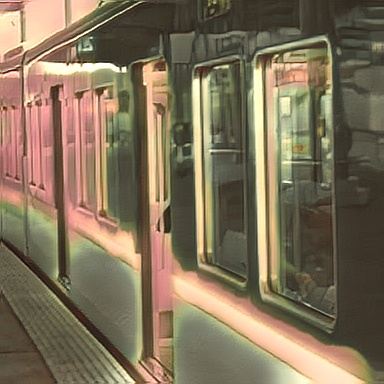

Real image:


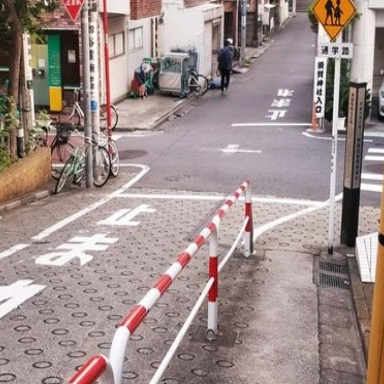

Fake image:


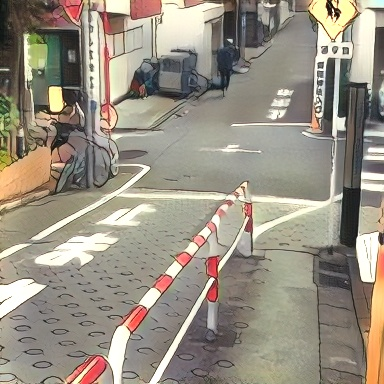

Fake image 25e:


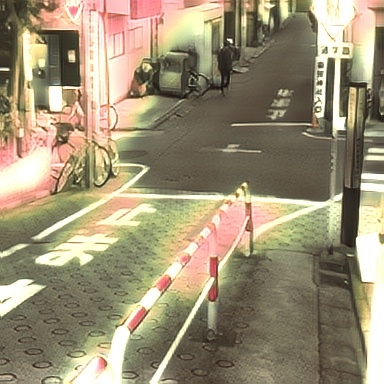

Real image:


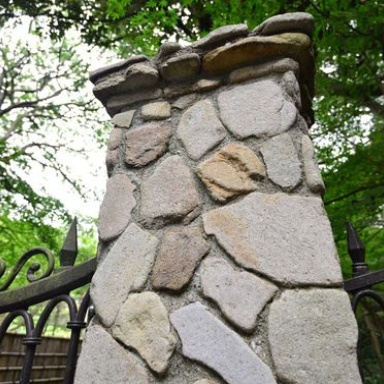

Fake image:


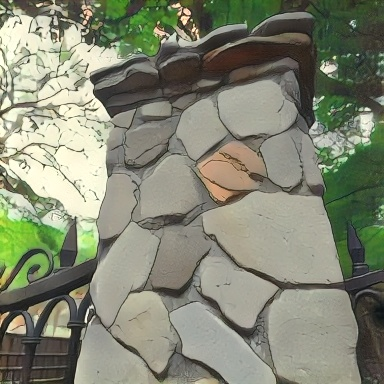

Fake image 25e:


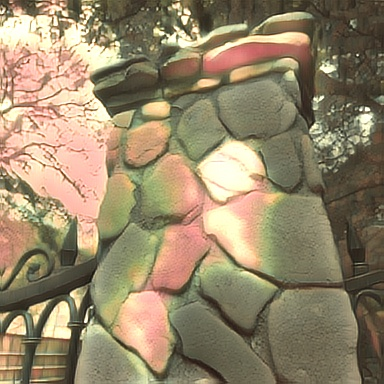

Real image:


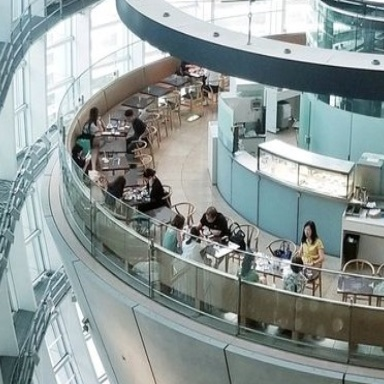

Fake image:


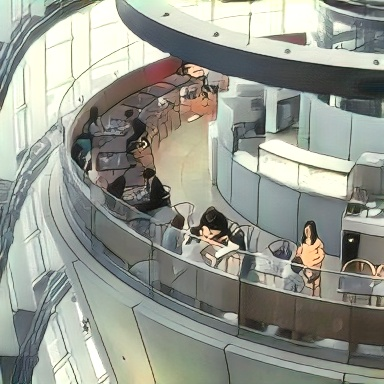

Fake image 25e:


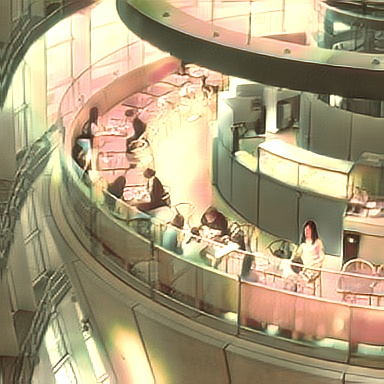

Real image:


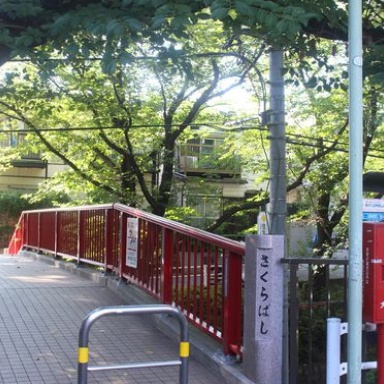

Fake image:


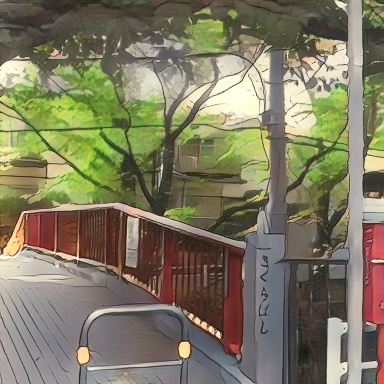

Fake image 25e:


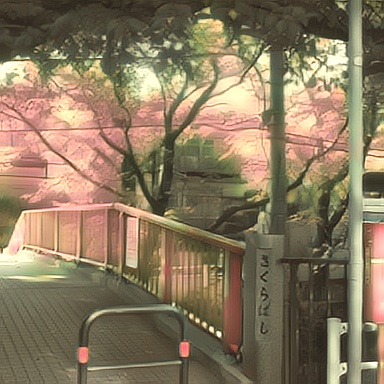

Real image:


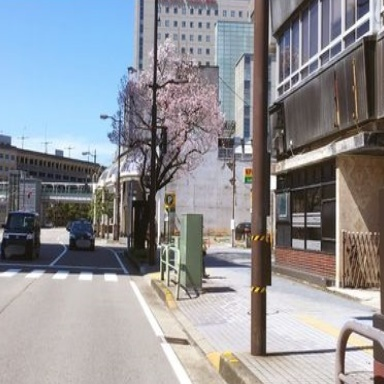

Fake image:


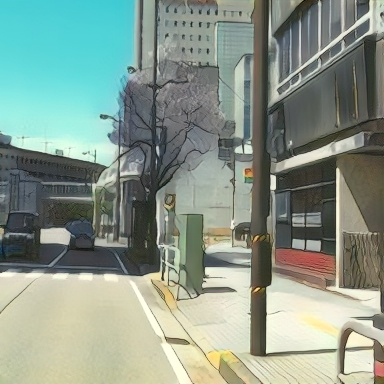

Fake image 25e:


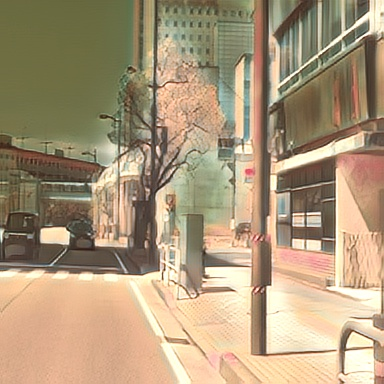

Real image:


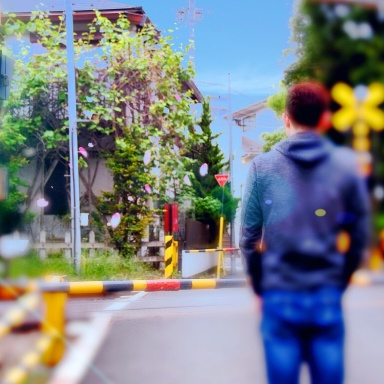

Fake image:


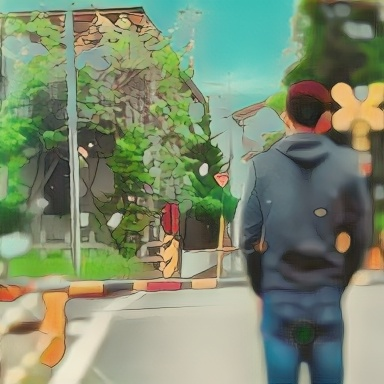

Fake image 25e:


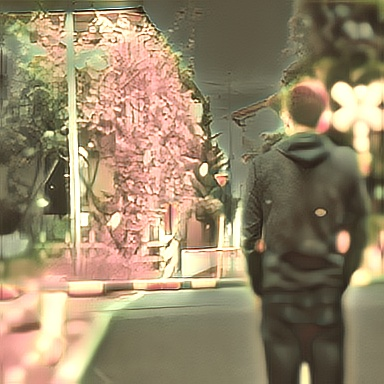

Real image:


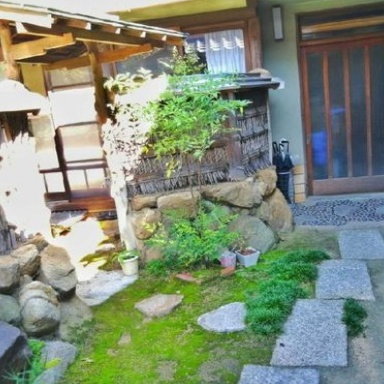

Fake image:


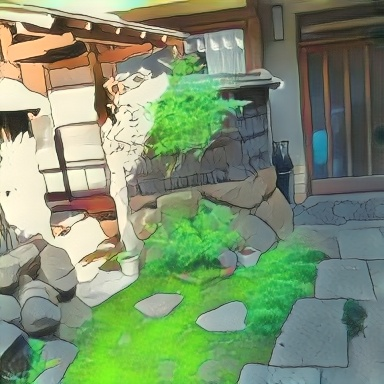

Fake image 25e:


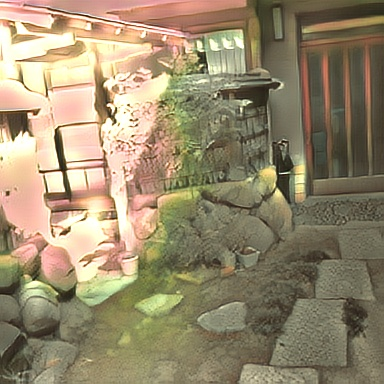

Real image:


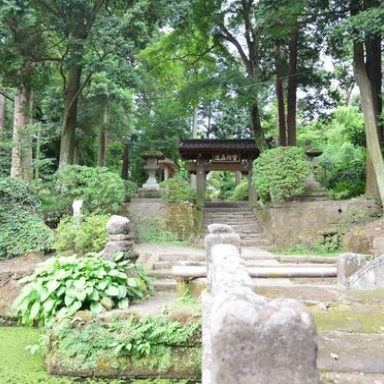

Fake image:


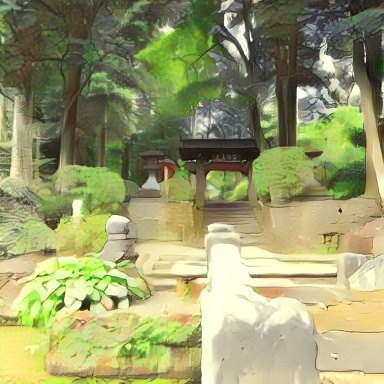

Fake image 25e:


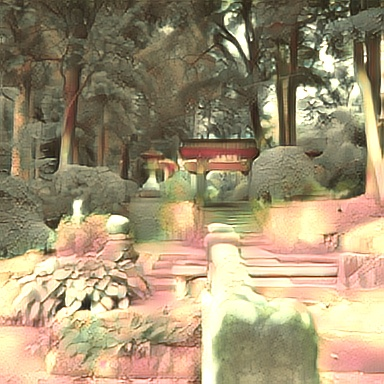

Real image:


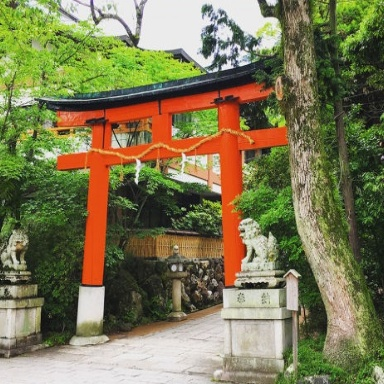

Fake image:


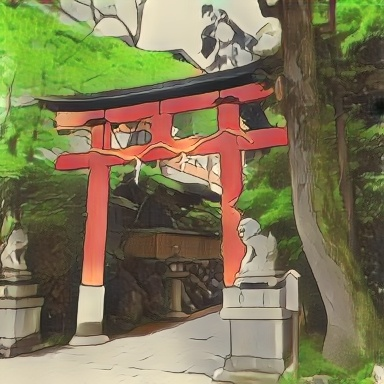

Fake image 25e:


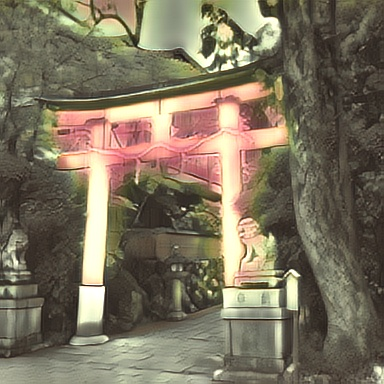

Real image:


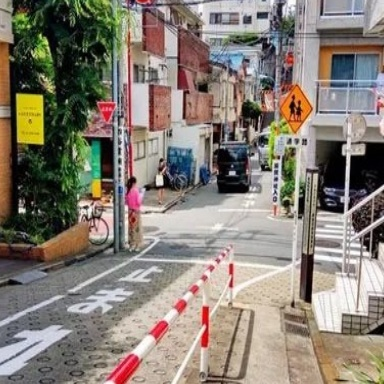

Fake image:


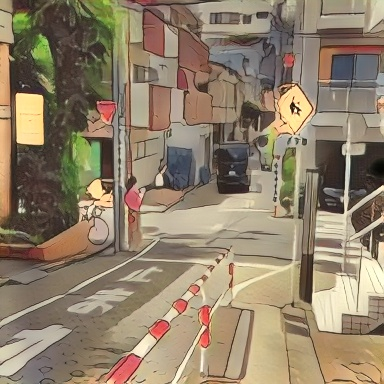

Fake image 25e:


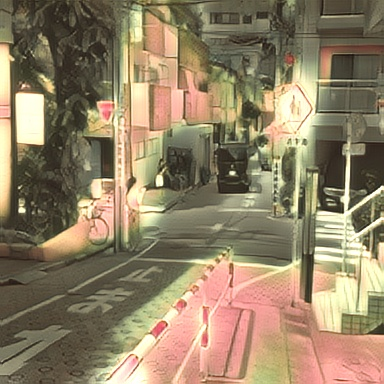

Real image:


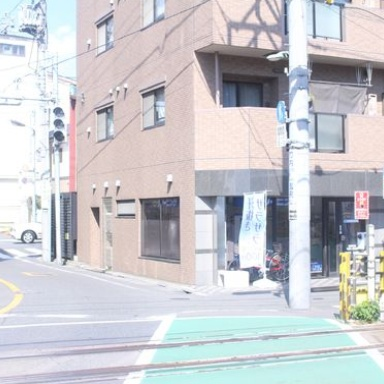

Fake image:


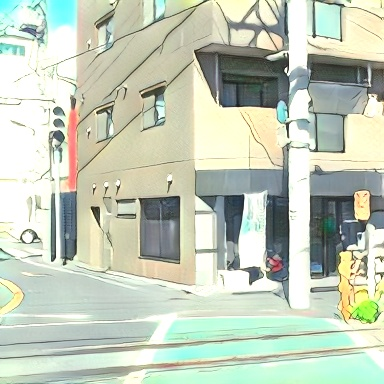

Fake image 25e:


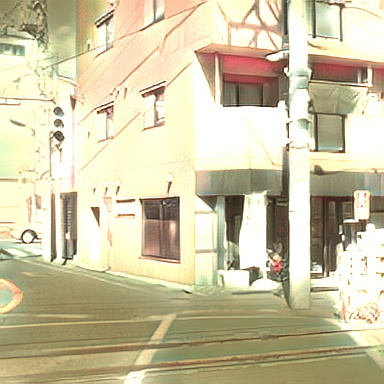

Real image:


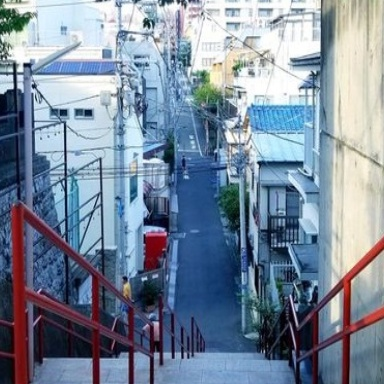

Fake image:


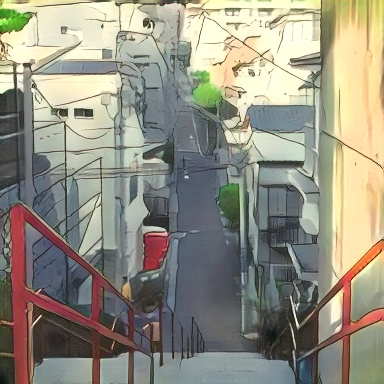

Fake image 25e:


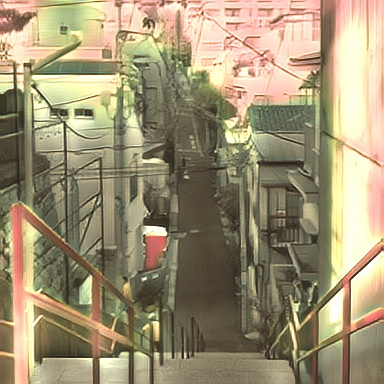

Real image:


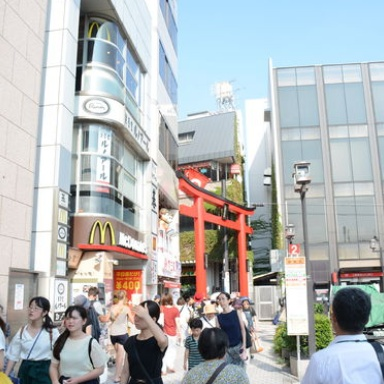

Fake image:


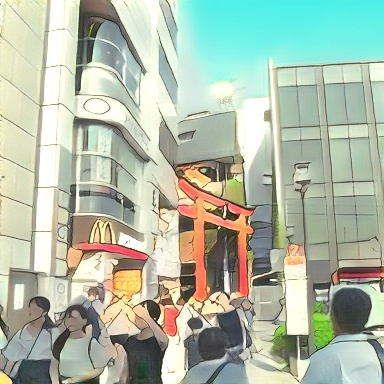

Fake image 25e:


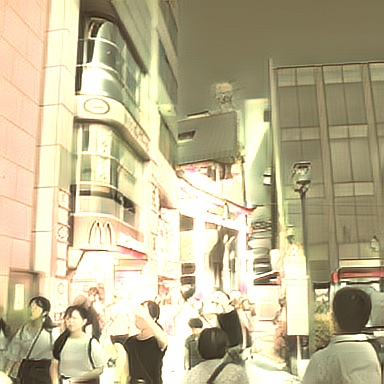

Real image:


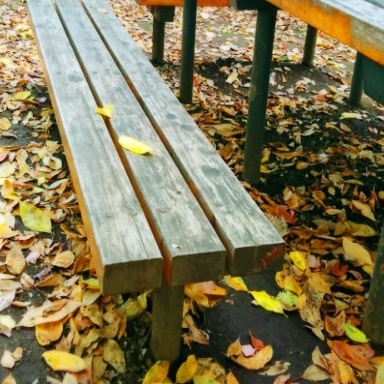

Fake image:


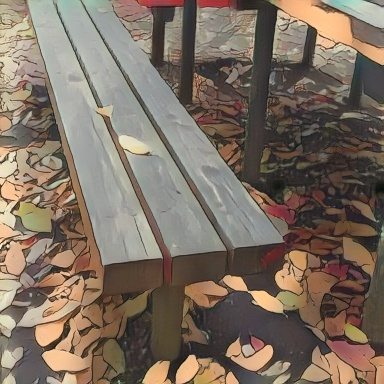

Fake image 25e:


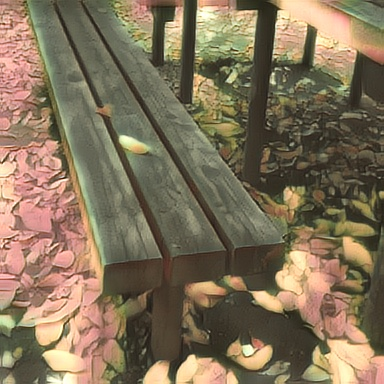

In [ ]:
import glob
from IPython.display import Image, display
images = glob.glob('/content/AnimeGAN/results/0e' + '/*.jpg')
images_25 = glob.glob('/content/AnimeGAN/results/25e' + '/*.jpg')
images_real = glob.glob('/content/AnimeGAN/dataset/test/real' + '/*.jpg')
a= 0

for img in images_real:
  print('Real image:')
  display(Image(img))
  print('Fake image:')
  display(Image(images[a]))
  print('Fake image 25e:')
  display(Image(images_25[a]))
  a = a+1
  print('=====================================================')

Real image:


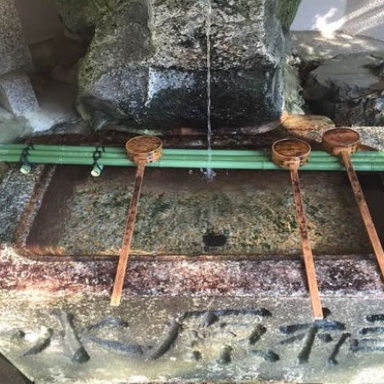

Fake image:


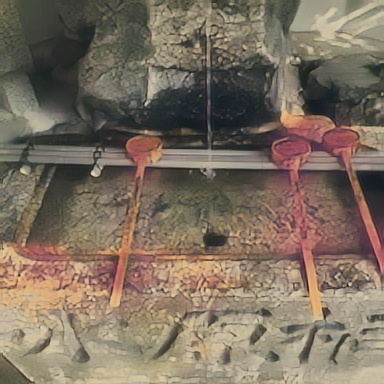

Real image:


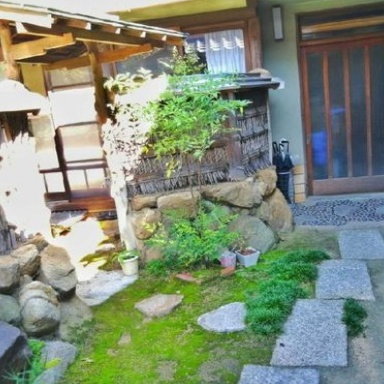

Fake image:


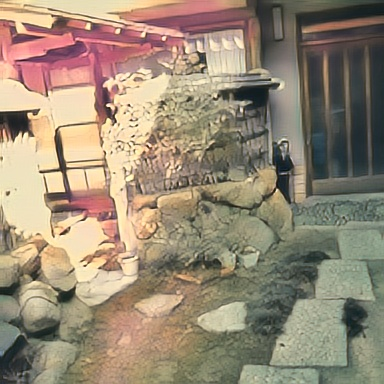

Real image:


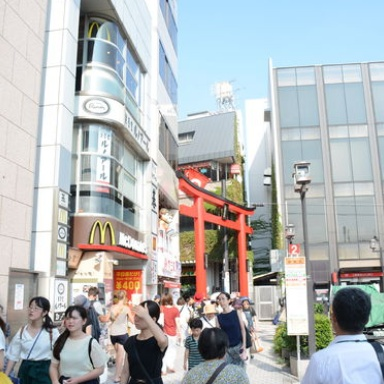

Fake image:


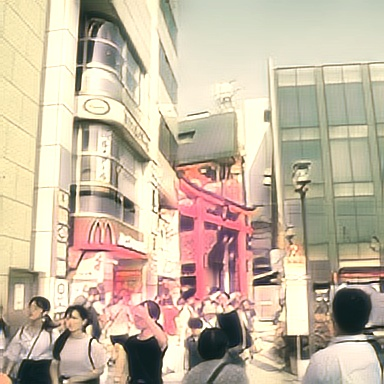

Real image:


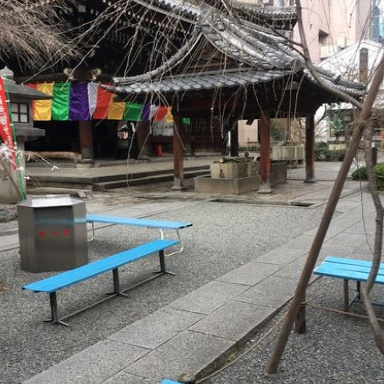

Fake image:


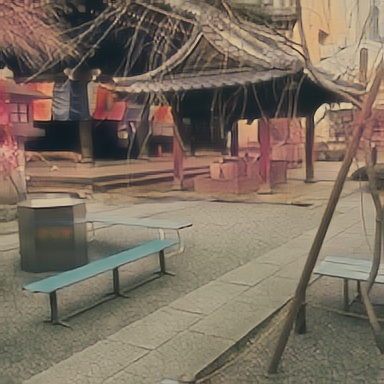

Real image:


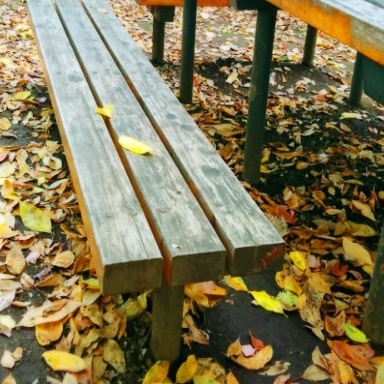

Fake image:


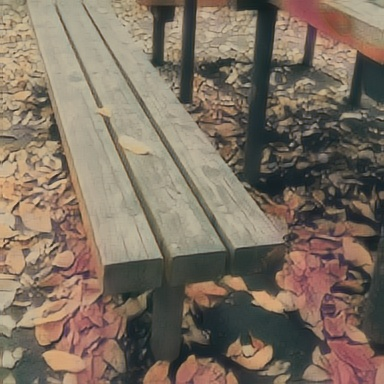

Real image:


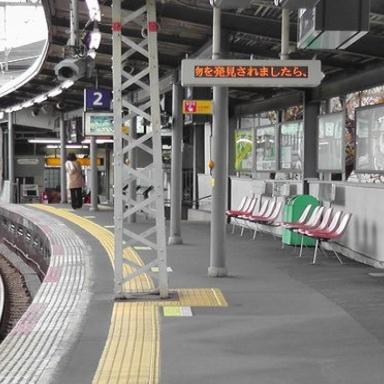

Fake image:


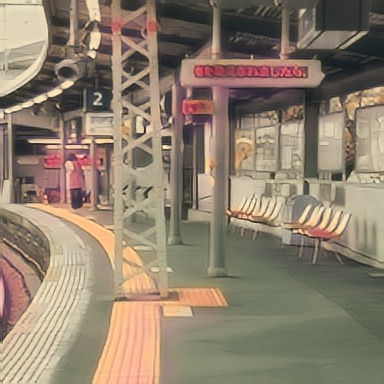

Real image:


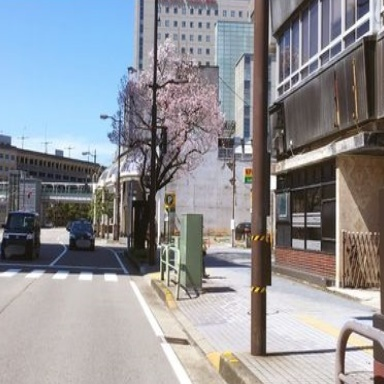

Fake image:


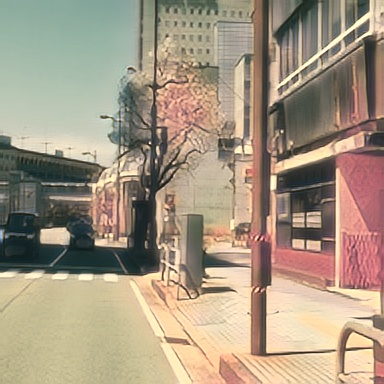

Real image:


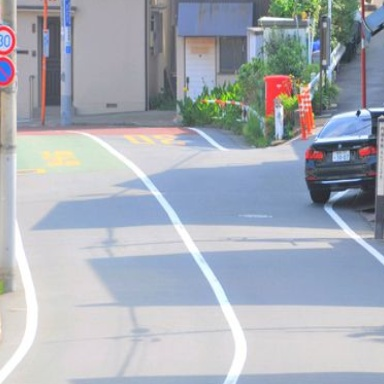

Fake image:


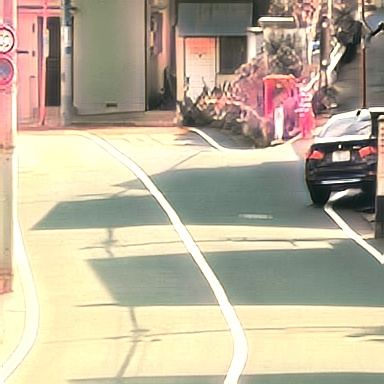

Real image:


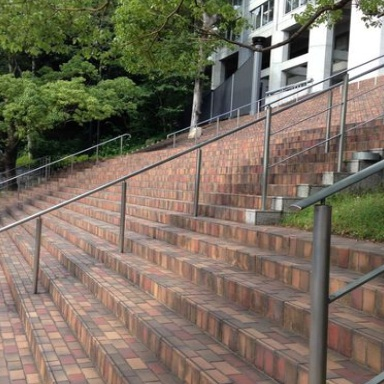

Fake image:


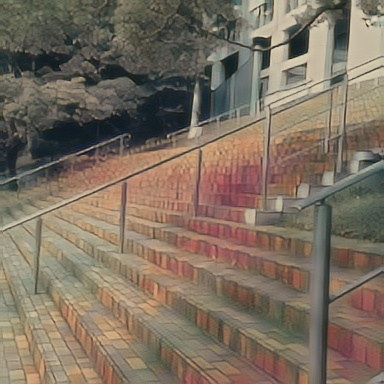

Real image:


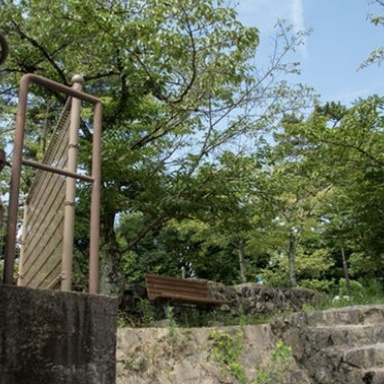

Fake image:


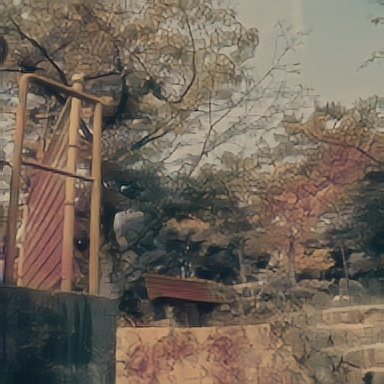

Real image:


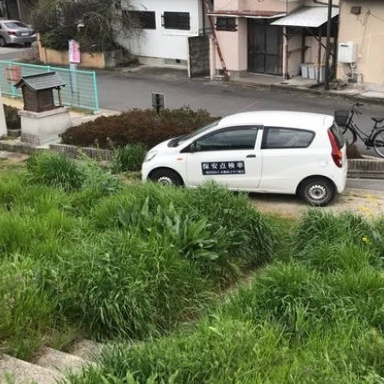

Fake image:


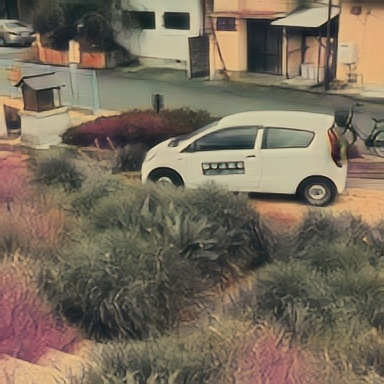

Real image:


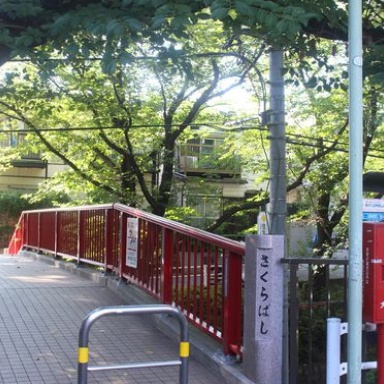

Fake image:


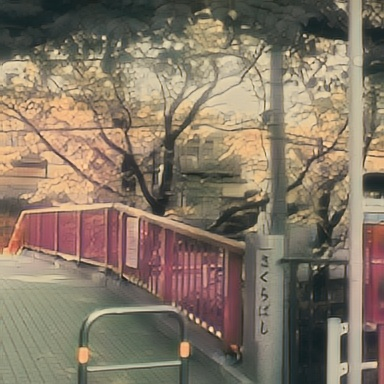

Real image:


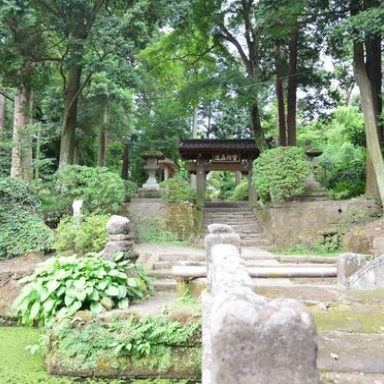

Fake image:


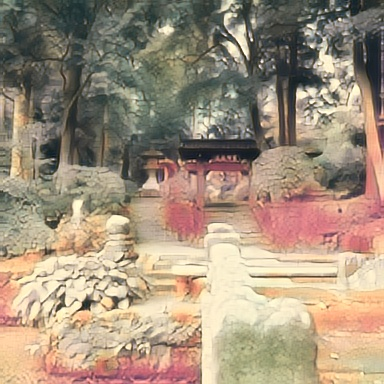

Real image:


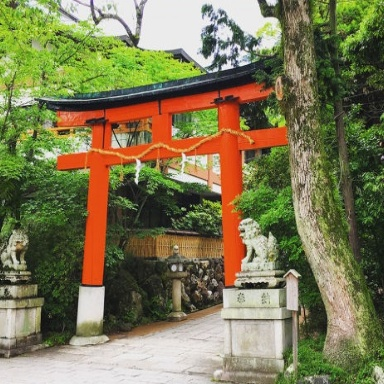

Fake image:


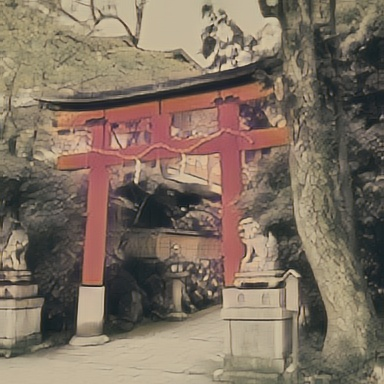

Real image:


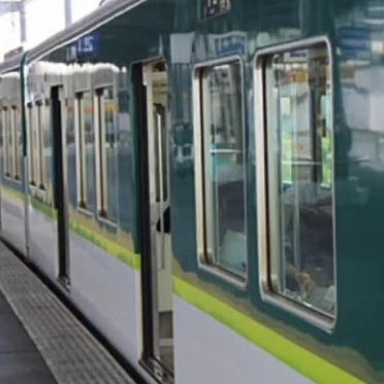

Fake image:


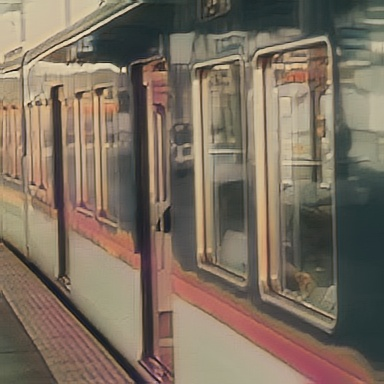

Real image:


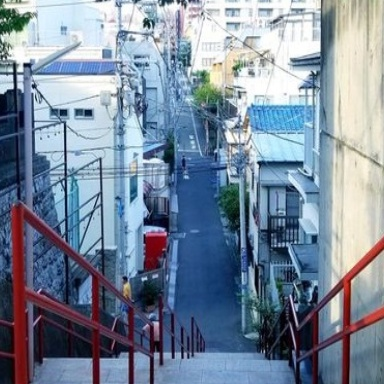

Fake image:


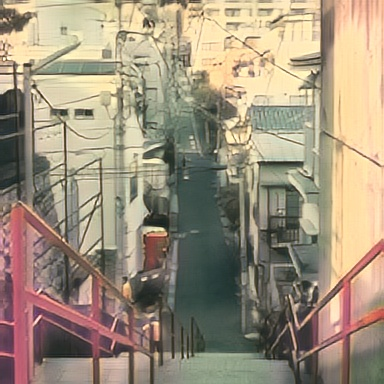

Real image:


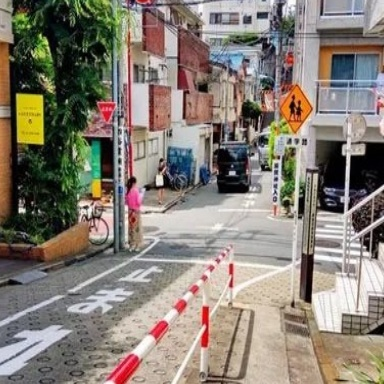

Fake image:


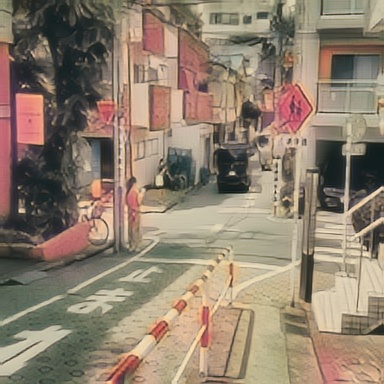

Real image:


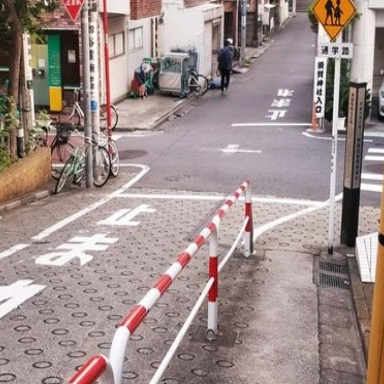

Fake image:


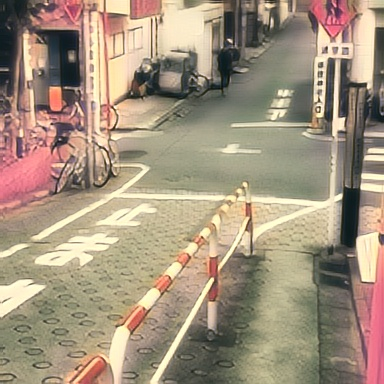

Real image:


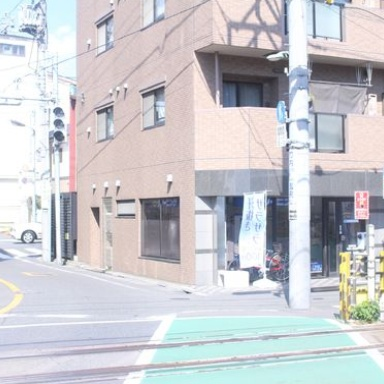

Fake image:


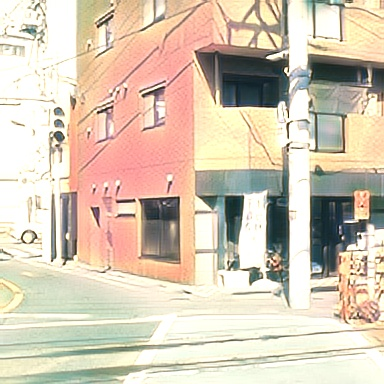

Real image:


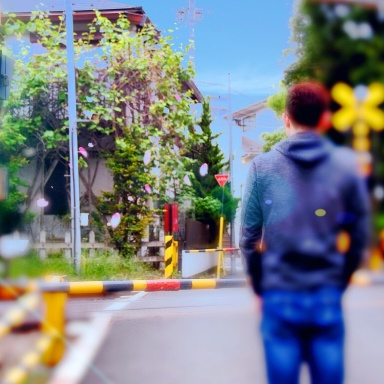

Fake image:


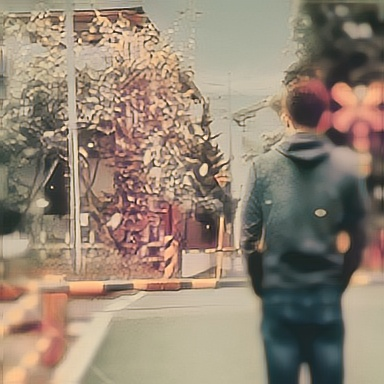

Real image:


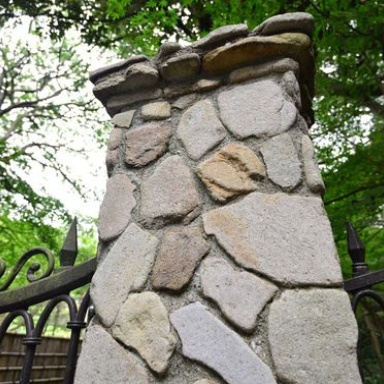

Fake image:


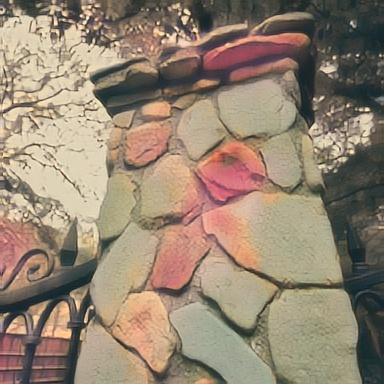

Real image:


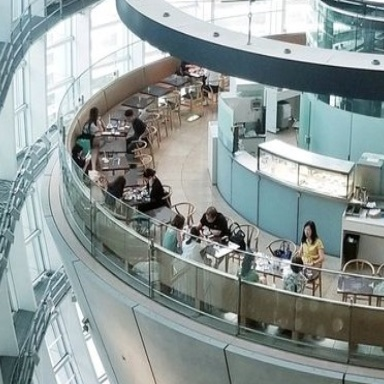

Fake image:


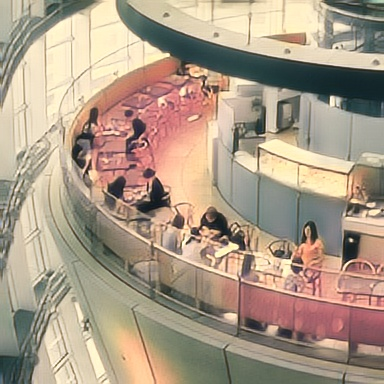

In [ ]:
import glob
from IPython.display import Image, display
images = glob.glob('/content/AnimeGAN/results/test' + '/*.jpg')
images_real = glob.glob('/content/AnimeGAN/dataset/test/real' + '/*.jpg')
a= 0

for img in images_real:
  print('Real image:')
  display(Image(img))
  print('Fake image:')
  display(Image(images[a]))
  a = a+1
  print('=====================================================')

Real image:


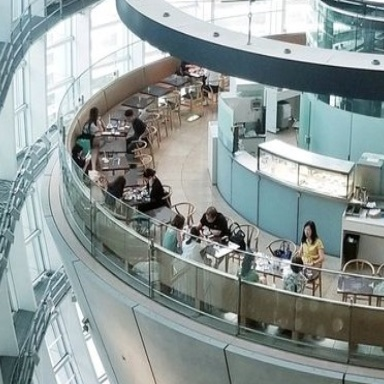

Fake image:


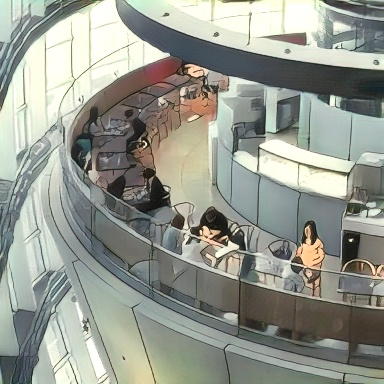

Fake image by 20 epoch:


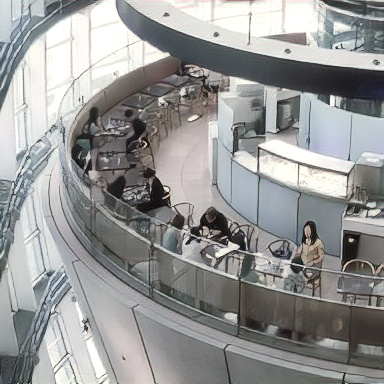

Real image:


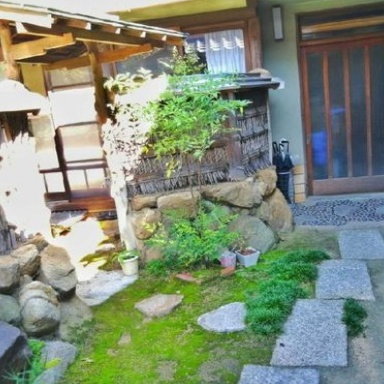

Fake image:


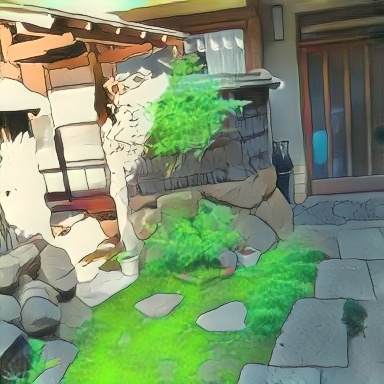

Fake image by 20 epoch:


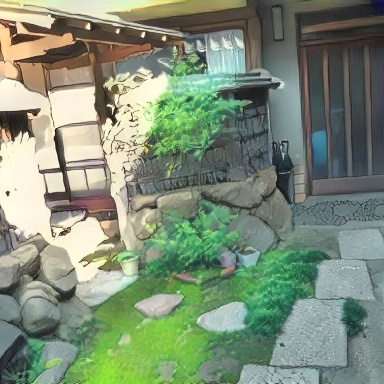

Real image:


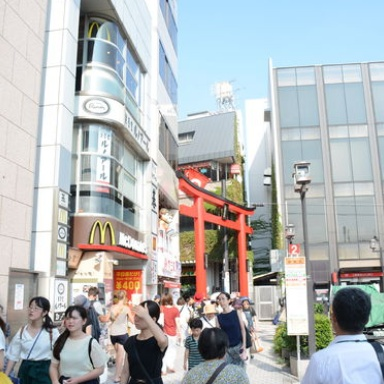

Fake image:


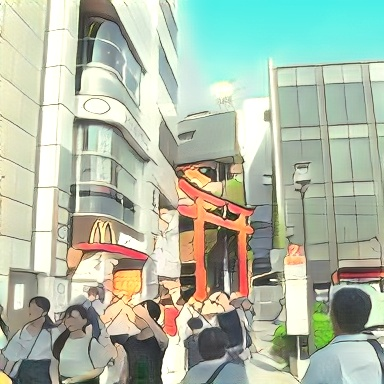

Fake image by 20 epoch:


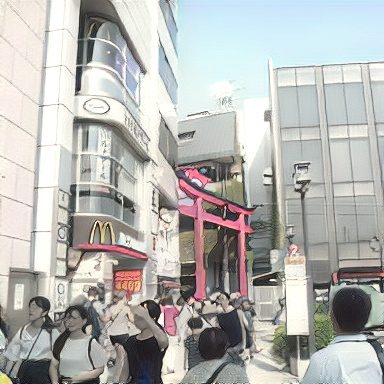

Real image:


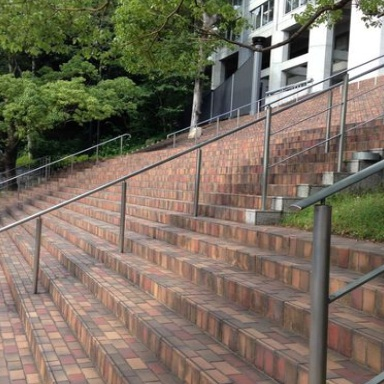

Fake image:


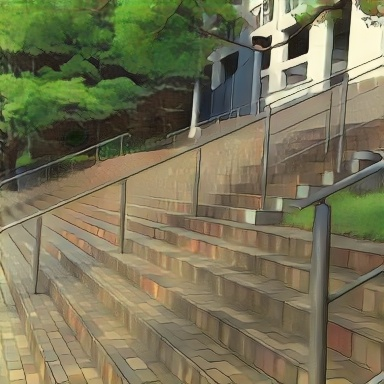

Fake image by 20 epoch:


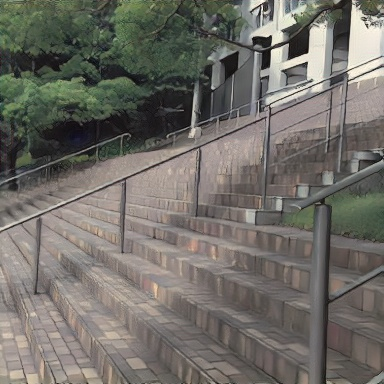

Real image:


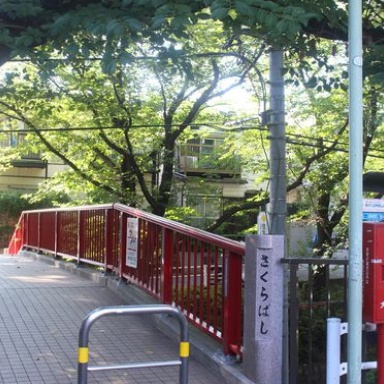

Fake image:


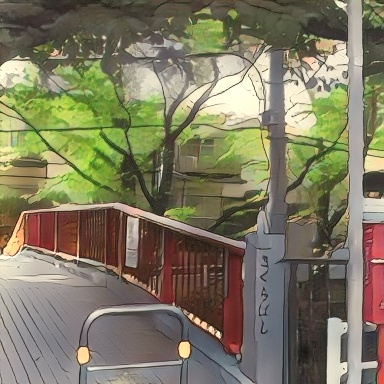

Fake image by 20 epoch:


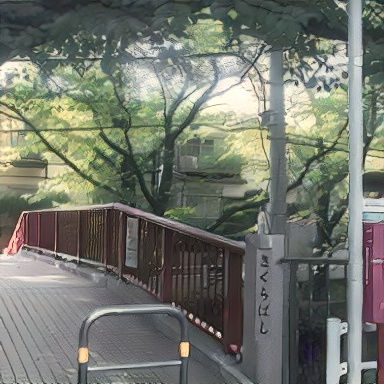

Real image:


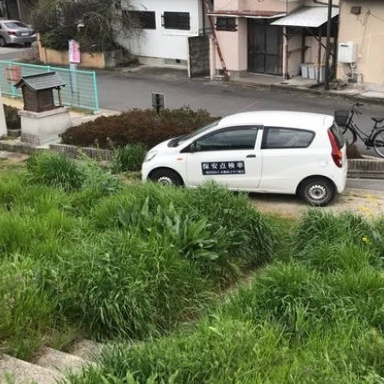

Fake image:


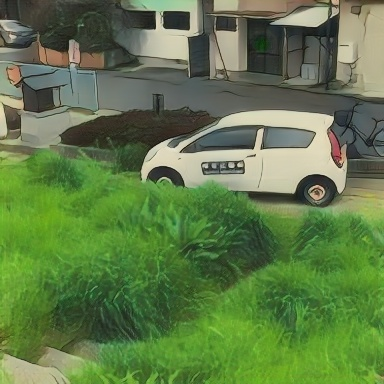

Fake image by 20 epoch:


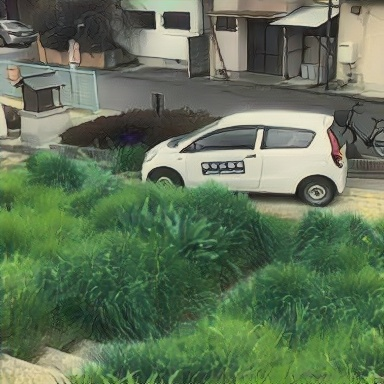

Real image:


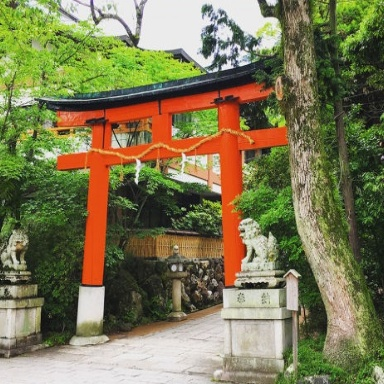

Fake image:


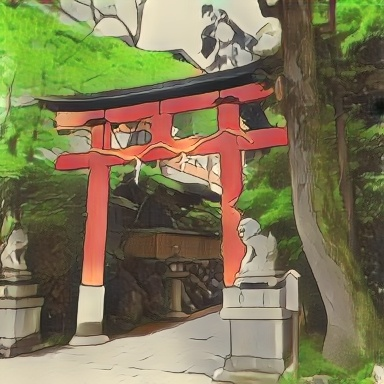

Fake image by 20 epoch:


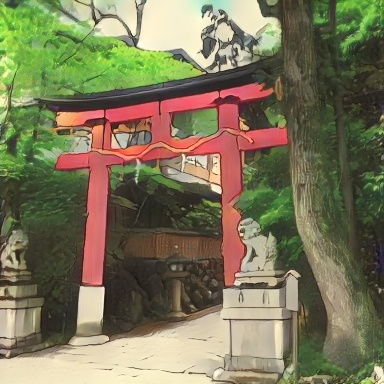

Real image:


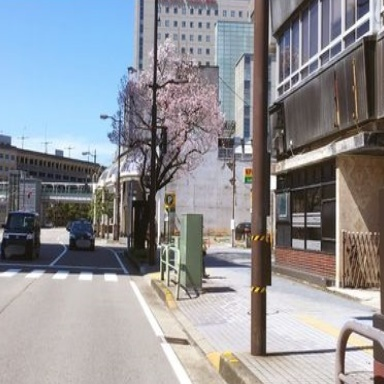

Fake image:


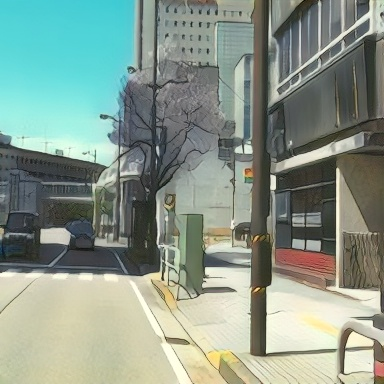

Fake image by 20 epoch:


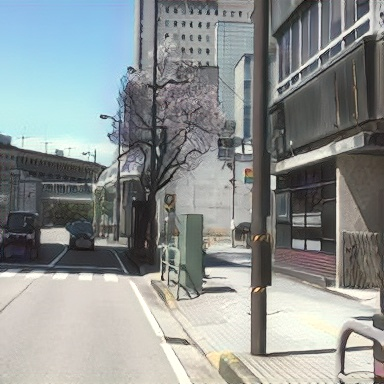

Real image:


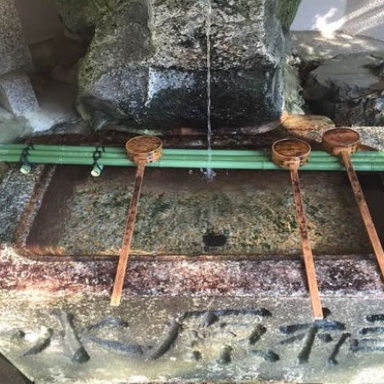

Fake image:


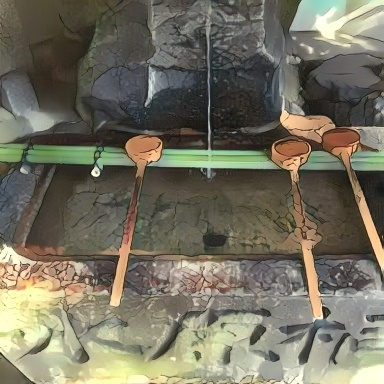

Fake image by 20 epoch:


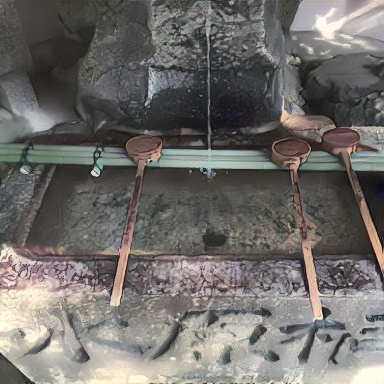

Real image:


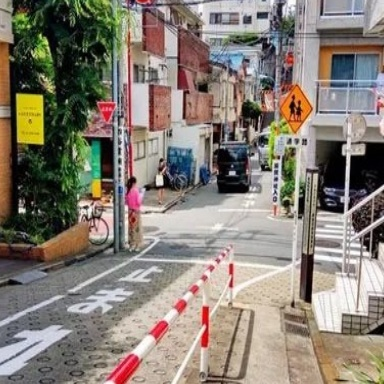

Fake image:


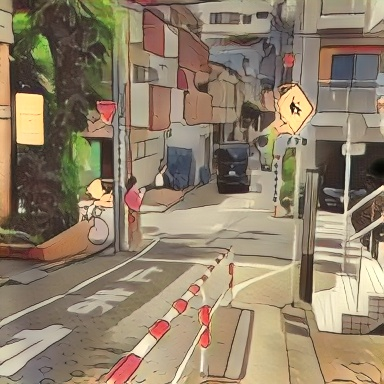

Fake image by 20 epoch:


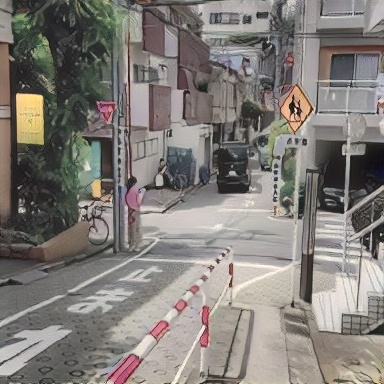

Real image:


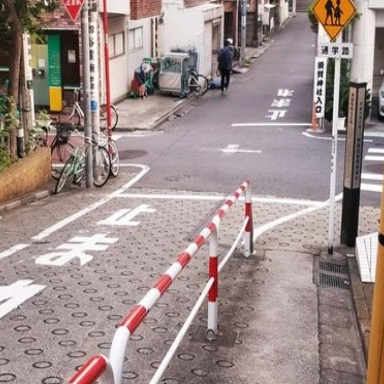

Fake image:


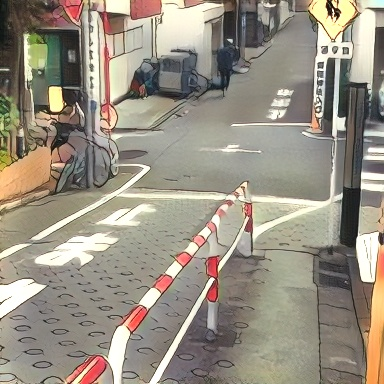

Fake image by 20 epoch:


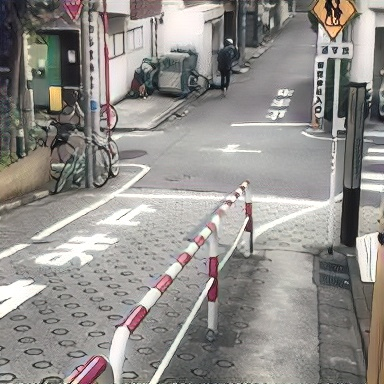

Real image:


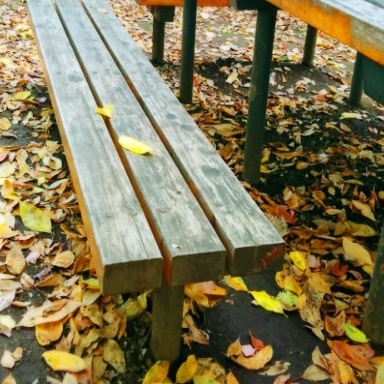

Fake image:


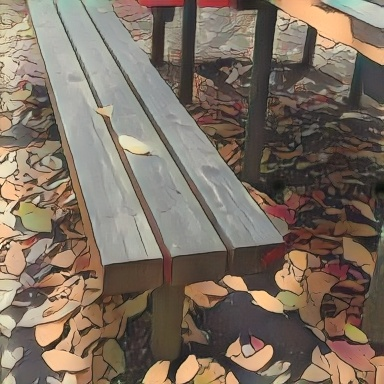

Fake image by 20 epoch:


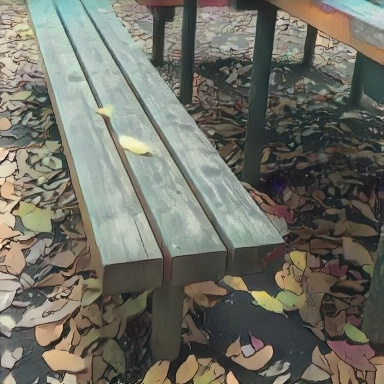

Real image:


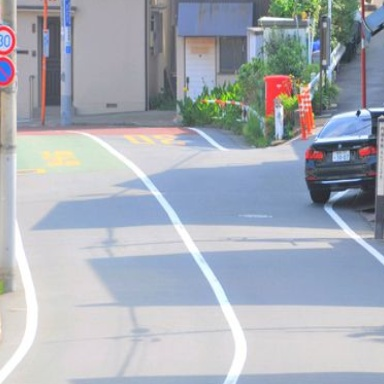

Fake image:


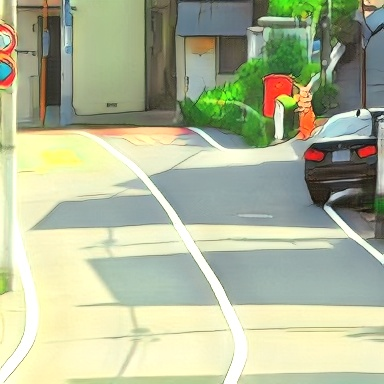

Fake image by 20 epoch:


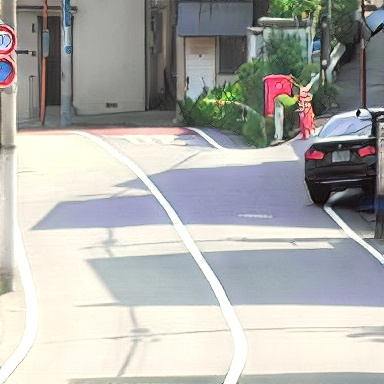

Real image:


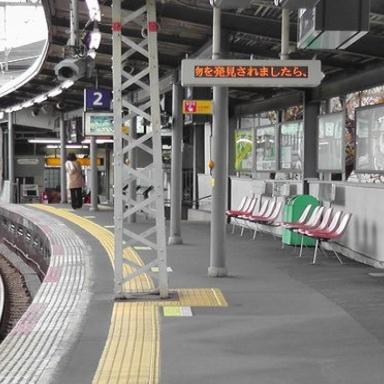

Fake image:


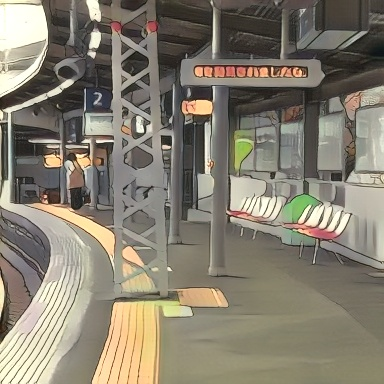

Fake image by 20 epoch:


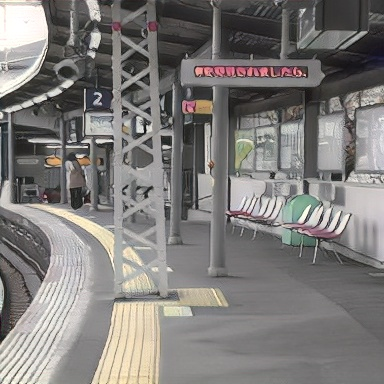

Real image:


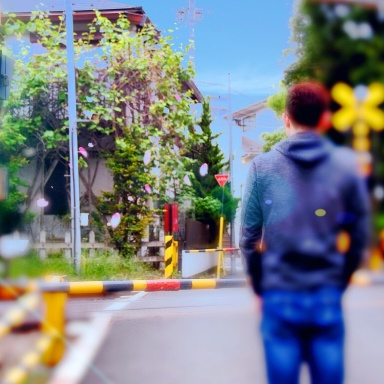

Fake image:


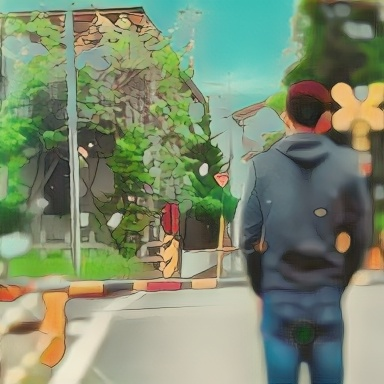

Fake image by 20 epoch:


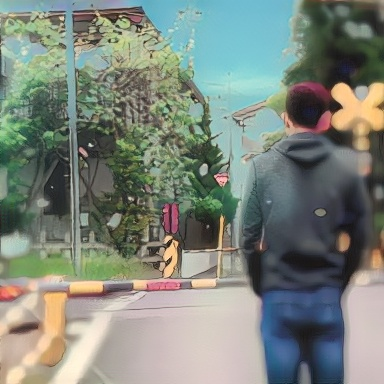

Real image:


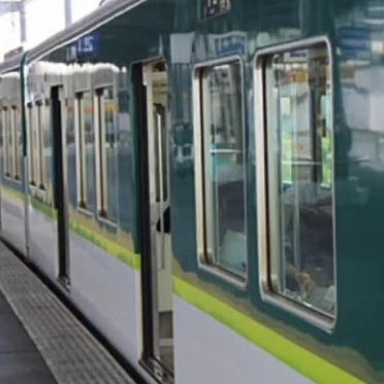

Fake image:


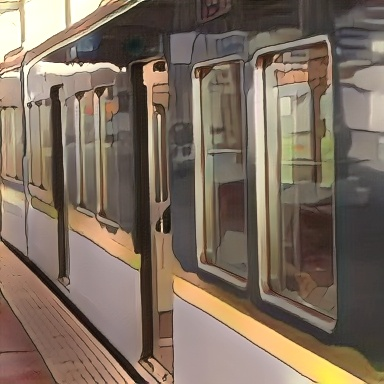

Fake image by 20 epoch:


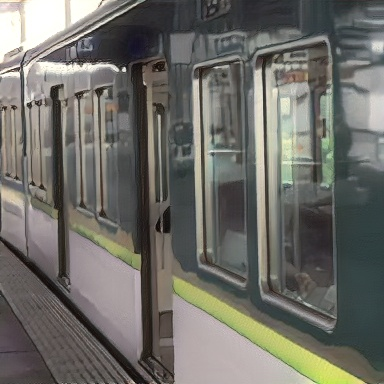

Real image:


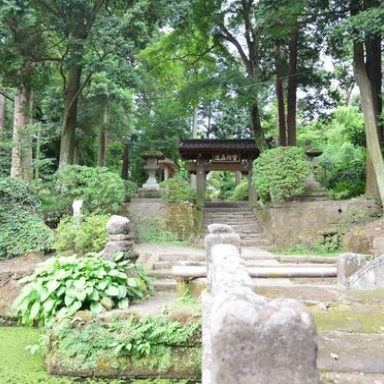

Fake image:


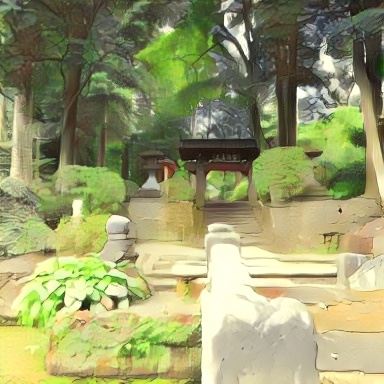

Fake image by 20 epoch:


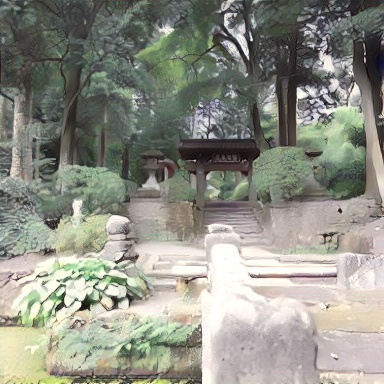

Real image:


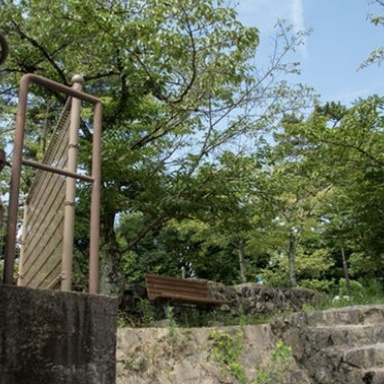

Fake image:


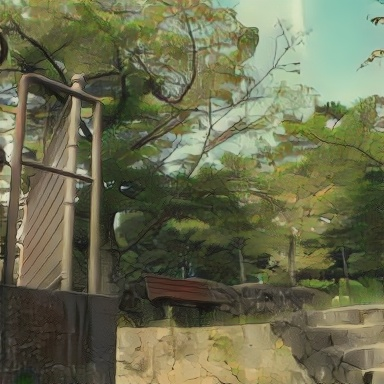

Fake image by 20 epoch:


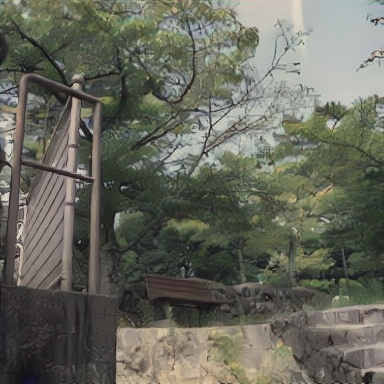

Real image:


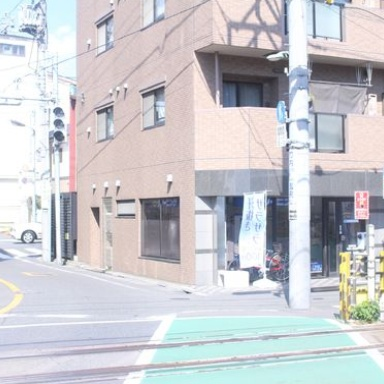

Fake image:


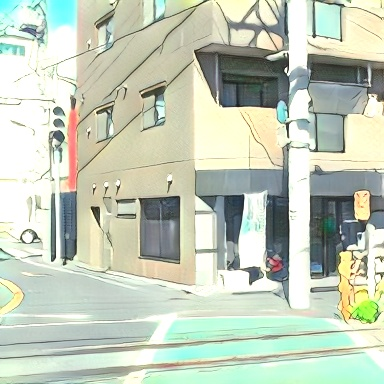

Fake image by 20 epoch:


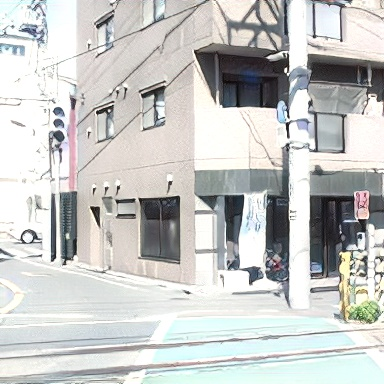

Real image:


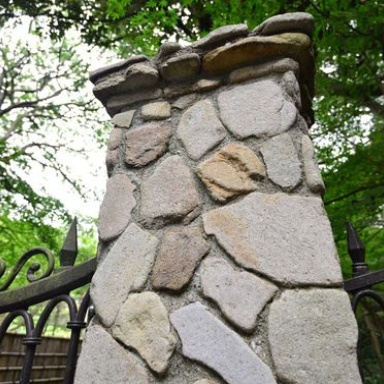

Fake image:


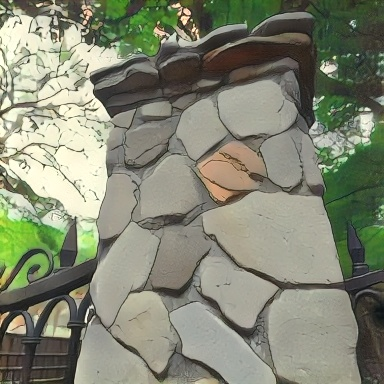

Fake image by 20 epoch:


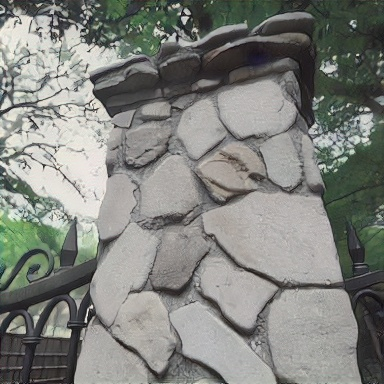

Real image:


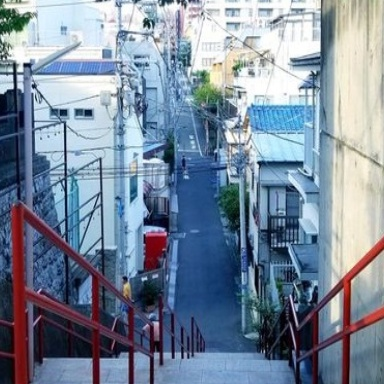

Fake image:


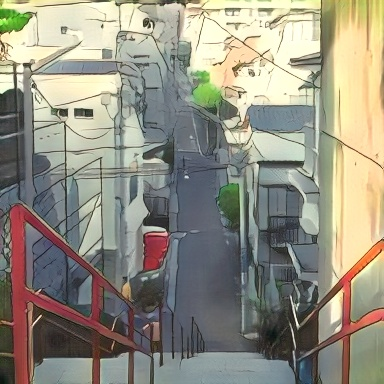

Fake image by 20 epoch:


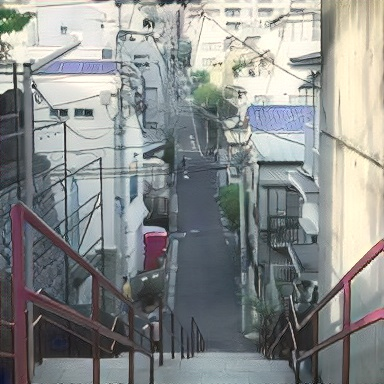

Real image:


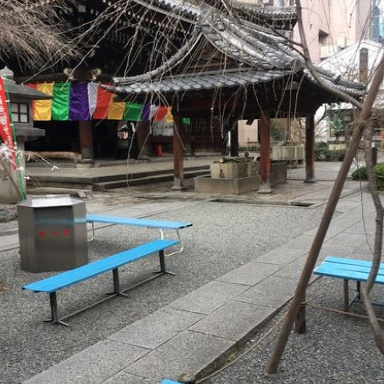

Fake image:


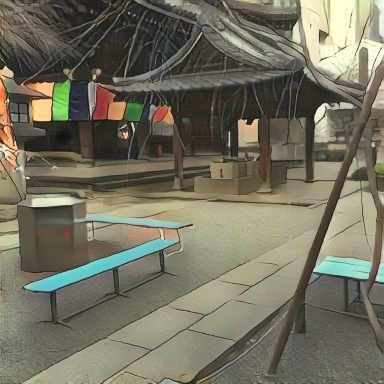

Fake image by 20 epoch:


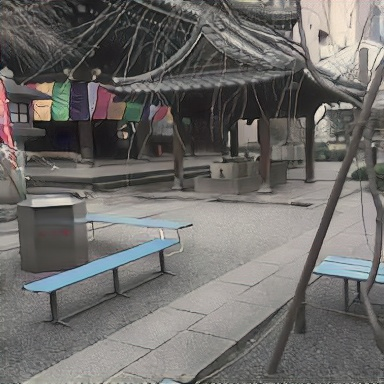

In [ ]:
import glob
from IPython.display import Image, display
images = glob.glob('/content/AnimeGAN/results/test' + '/*.jpg')
images_real = glob.glob('/content/AnimeGAN/dataset/test/real' + '/*.jpg')
a= 0

for img in images_real:
  print('Real image:')
  display(Image(img))
  print('Fake image:')
  display(Image(images[a]))
  a = a+1
  print('=====================================================')

In [ ]:
%cd /content/AnimeGAN/results/image_fake/
!ls

In [ ]:
!zip results.zip *.jpg

In [ ]:
import glob
from IPython.display import Image, display
images = glob.glob('/content/AnimeGAN/results/0e' + '/*.jpg')
images_5 = glob.glob('/content/AnimeGAN/results/5e' + '/*.jpg')
images_10 = glob.glob('/content/AnimeGAN/results/10e' + '/*.jpg')
images_10_10 = glob.glob('/content/AnimeGAN/results/10e-10' + '/*.jpg')

images_real = glob.glob('/content/AnimeGAN/dataset/photo' + '/*.jpg')
a= 0

for img in images_real:
  print('Real image:')
  display(Image(img))
  print('Fake image:')
  display(Image(images[a]))
  print('Fake image by 10 epoch with w_color = 5:')
  display(Image(images_5[a]))
  print('Fake image by 10 epoch with w_color = 10:')
  display(Image(images_10_10[a]))
  print('Fake image by 20 epoch with w_color = 10:')
  display(Image(images_10[a])) 
  a = a+1
  print('=====================================================')

In [ ]:
import glob
from IPython.display import Image, display
images = glob.glob('/content/AnimeGAN/results/0' + '/*.jpg')
images_10 = glob.glob('/content/AnimeGAN/results/10' + '/*.jpg')
images_15 = glob.glob('/content/AnimeGAN/results/15' + '/*.jpg')
images_20 = glob.glob('/content/AnimeGAN/results/20' + '/*.jpg')

images_real = glob.glob('/content/AnimeGAN/dataset/photo' + '/*.jpg')
a= 0

for img in images_real:
  print('Real image:')
  display(Image(img))
  print('Fake image:')
  display(Image(images[a]))
  print('Fake image with 10e:')
  display(Image(images_10[a]))
  print('Fake image with 15e:')
  display(Image(images_15[a])) 
  print('Fake image with 20e:')
  display(Image(images_20[a])) 
  a = a+1
  print('=====================================================')